# 10-2. 트랜스포머와 인코더 디코더
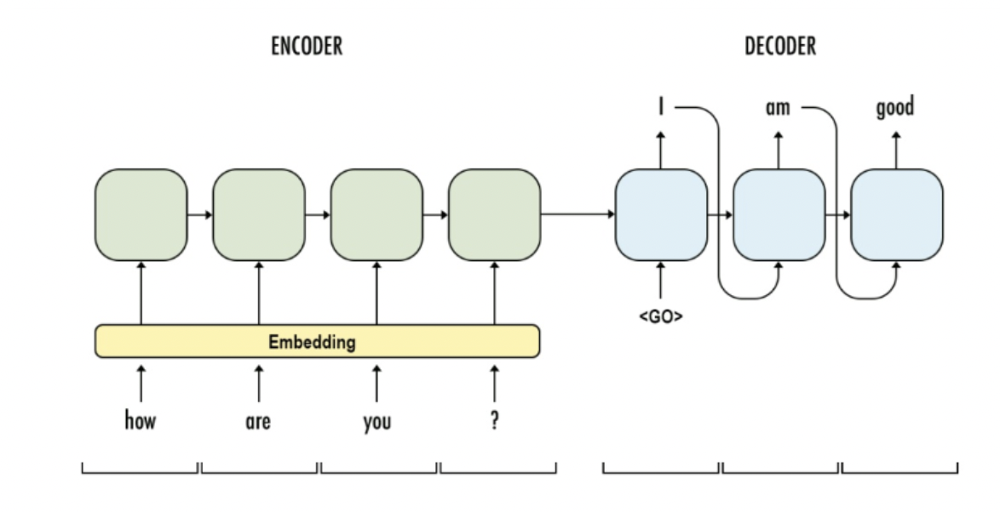

`번역기`는 Encoder와 Decoder 두 가지 아키텍처로 구성.  
Encoder에 input 문장이 들어가고, Decoder는 이에 상응하는 output 문장을 생성  
-Training->  
input 문장과 output 문장 두 가지 병렬 구조로 구성된 데이터셋을 훈련한다.

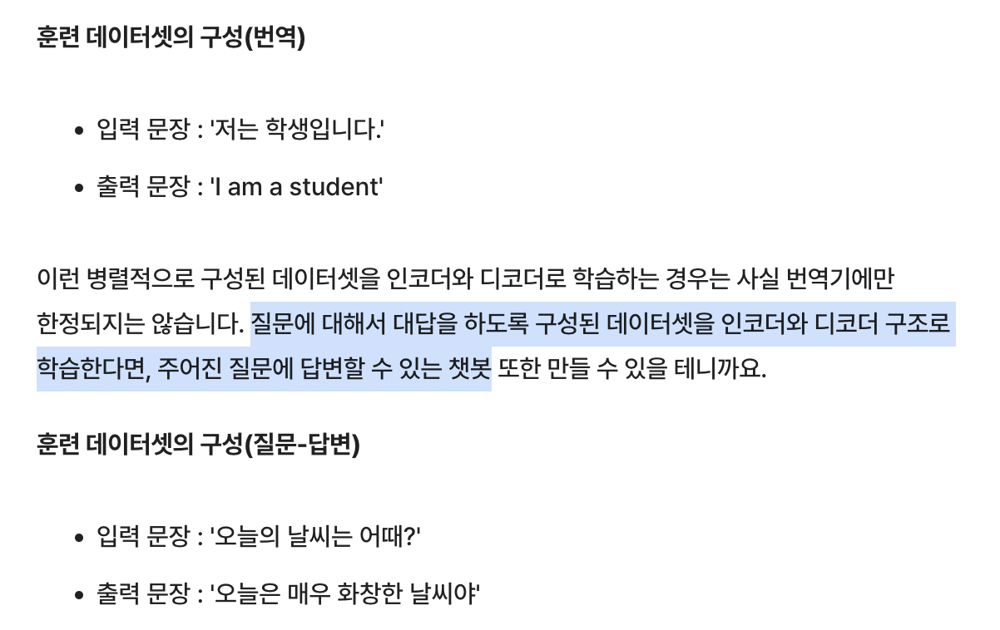

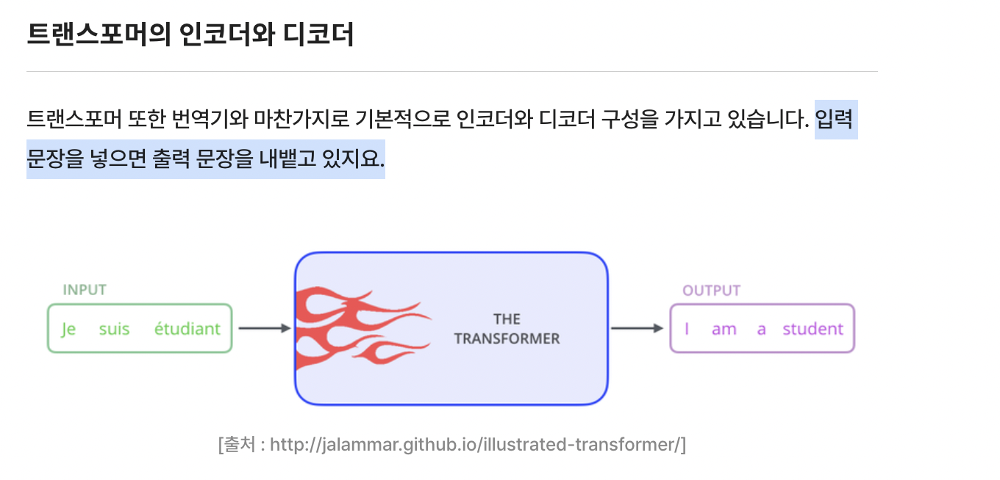

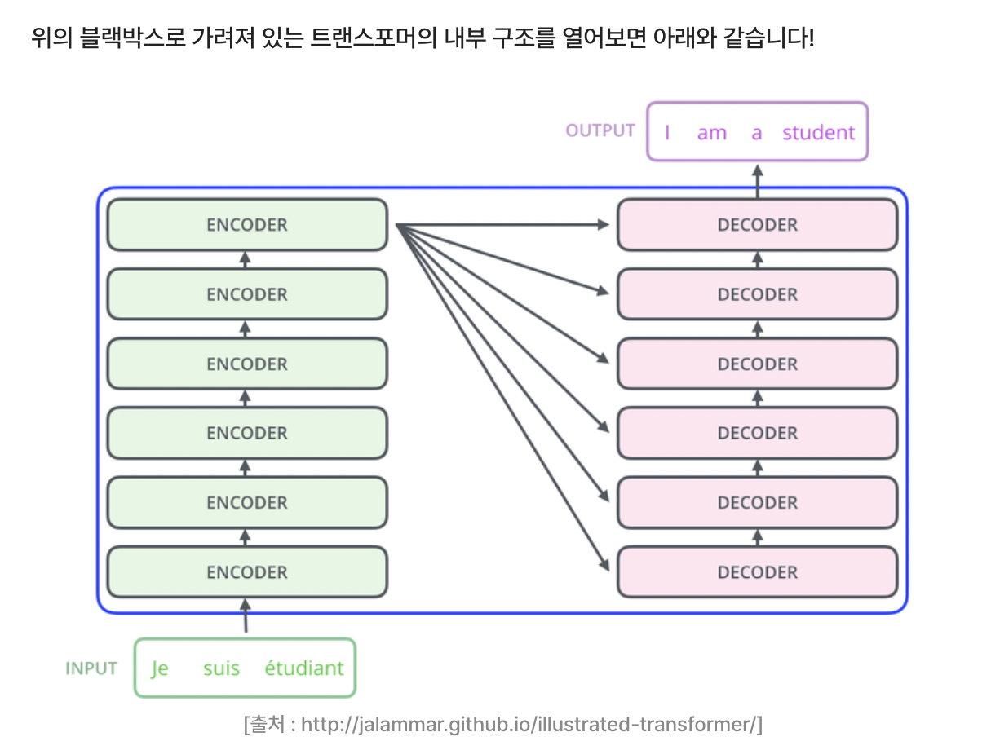
input 문장은 누적해 쌓아 올린 Encoder layer(Green)을 통해서 정보를 뽑아내고,  
Decoder는 누적해 쌓아 올린 Decoder layer(Pink)을 통해서  
output 문장의 단어를 하나씩 만들어가는 구조를 갖고 있어요

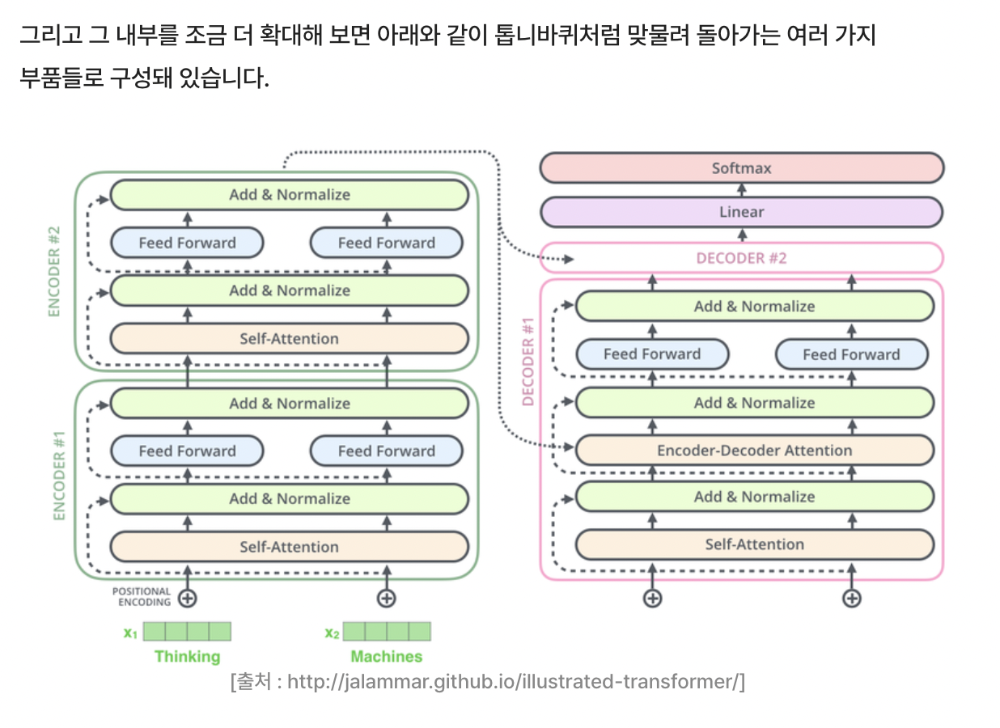

In [1]:
import tensorflow as tf
import tensorflow_datasets as tfds
import os
import re
import numpy as np
import matplotlib.pyplot as plt

많은 자연어 처리 모델들은 텍스트 문장을 입력으로 받기 위해 단어를 임베딩 벡터로 변환하는 벡터화 과정을 거칩니다.  

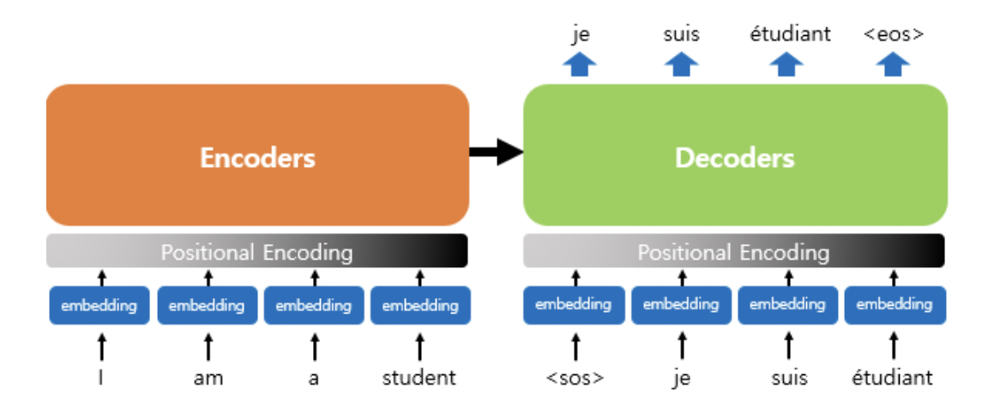
### Transformer model's input data 처리에는 RNN 계열과 다른 1가지
__Embedding Vector에 어떤 값을 더해준 뒤에 input으로 사용__ 한다는 점입니다.  
그 값은 바로 위 그림에서의 positional Encoding에 해당
> 많은 자연어 처리 모델들은 Text 문장을 input으로 받기 위해  
> Words를 Embedding Vecotr로 변환하는 벡터화 과정을 거칩니다.  

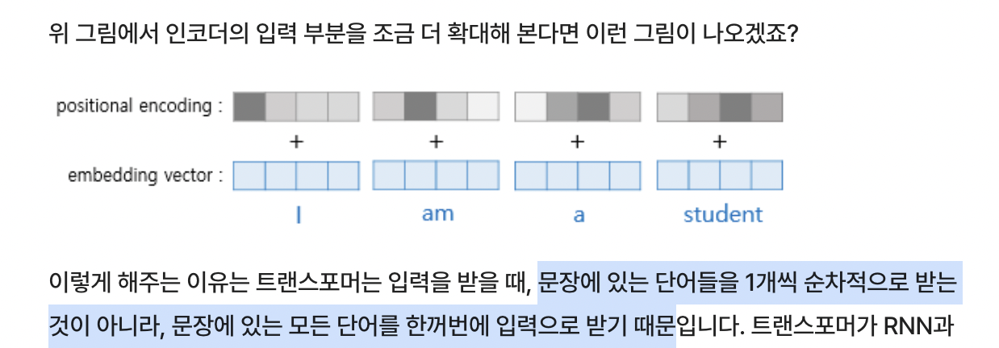

Transformer가 RNN과 결정적으로 다른 점이 바로 이 부분입니다.  

RNN에는 어차피 문장을 구성하는 단어들이 어순대로 model에 input되므로,  
model에게 따로 어순 정보를 알려줄 필요가 없었습니다.  

그러나 문장에 있는 모든 단어를 한꺼번에 문장 단위로 input받는 Transformer는  
자칫 'I ate lunch'와 'lunch ate I'를 구분할 수 없을지도 모릅니다.  
그래서 같은 단어라도 __그 단어가 문장의 몇 번째 어순으로 input되었는지__ 를  
model에 추가로 알려 주기 위해,  
단어의 Embedding Vecotr에다가 위치 정보를 가진 벡터(Positional Encoding) 값을 더해서  
model의 input으로 삼는 것이지요!

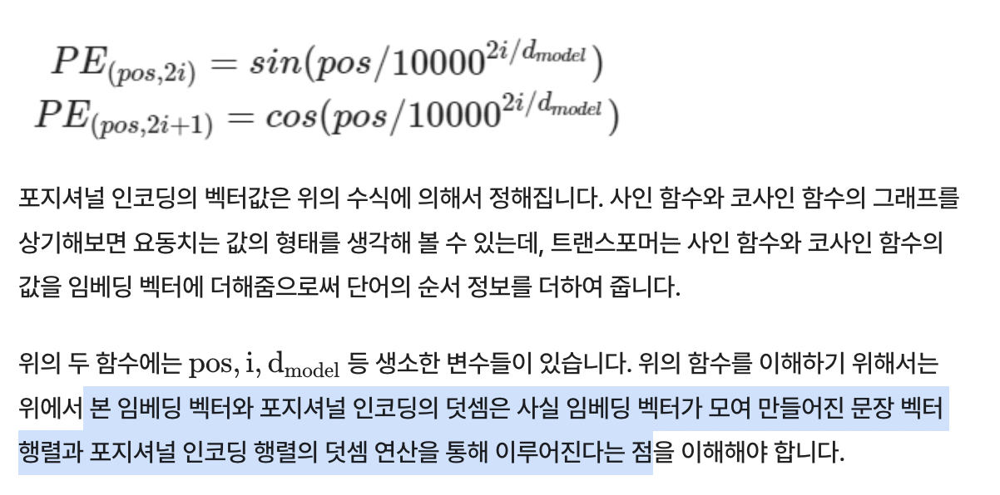

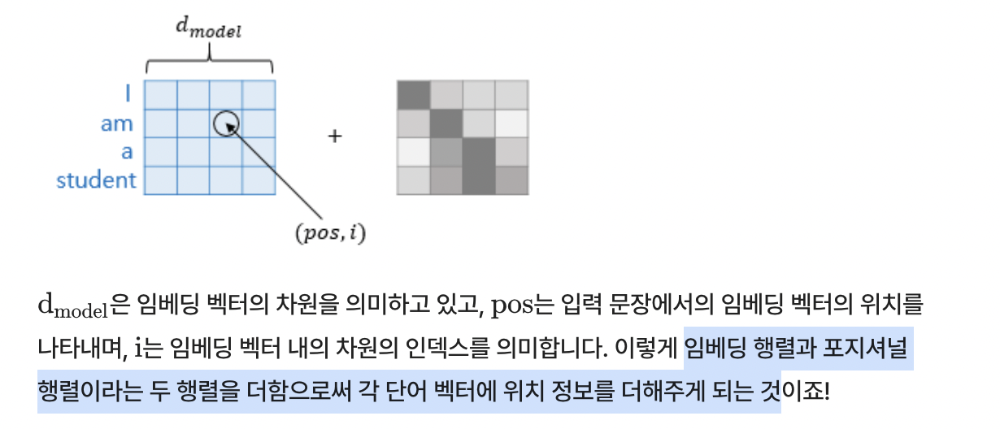

In [2]:
# 포지셔널 인코딩 레이어
class PositionalEncoding(tf.keras.layers.Layer):

  def __init__(self, position, d_model):
    super(PositionalEncoding, self).__init__()
    self.pos_encoding = self.positional_encoding(position, d_model)

  def get_angles(self, position, i, d_model):
    angles = 1 / tf.pow(10000, (2 * (i // 2)) / tf.cast(d_model, tf.float32))
    return position * angles

  def positional_encoding(self, position, d_model):
    # 각도 배열 생성
    angle_rads = self.get_angles(
        position=tf.range(position, dtype=tf.float32)[:, tf.newaxis],
        i=tf.range(d_model, dtype=tf.float32)[tf.newaxis, :],
        d_model=d_model)

    # 배열의 짝수 인덱스에는 sin 함수 적용
    sines = tf.math.sin(angle_rads[:, 0::2])
    # 배열의 홀수 인덱스에는 cosine 함수 적용
    cosines = tf.math.cos(angle_rads[:, 1::2])

    # sin과 cosine이 교차되도록 재배열
    pos_encoding = tf.stack([sines, cosines], axis=0)
    pos_encoding = tf.transpose(pos_encoding,[1, 2, 0]) 
    pos_encoding = tf.reshape(pos_encoding, [position, d_model])

    pos_encoding = pos_encoding[tf.newaxis, ...]
    return tf.cast(pos_encoding, tf.float32)

  def call(self, inputs):
    return inputs + self.pos_encoding[:, :tf.shape(inputs)[1], :]


row의 크기가 50,  
column의 크기가 512인 행렬을 그려봅시다.  
이를테면, 최대 문장의 길이가 50이고  
word embedding dimension을 512로 하는 모델의 입력 벡터 모양이 이와 같을 것입니다.

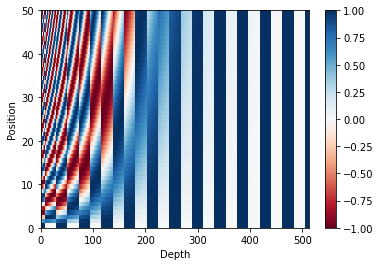

In [3]:
sample_pos_encoding = PositionalEncoding(50, 512)

plt.pcolormesh(sample_pos_encoding.pos_encoding.numpy()[0], cmap='RdBu')
plt.xlabel('Depth')
plt.xlim((0, 512))
plt.ylabel('Position')
plt.colorbar()
plt.show()

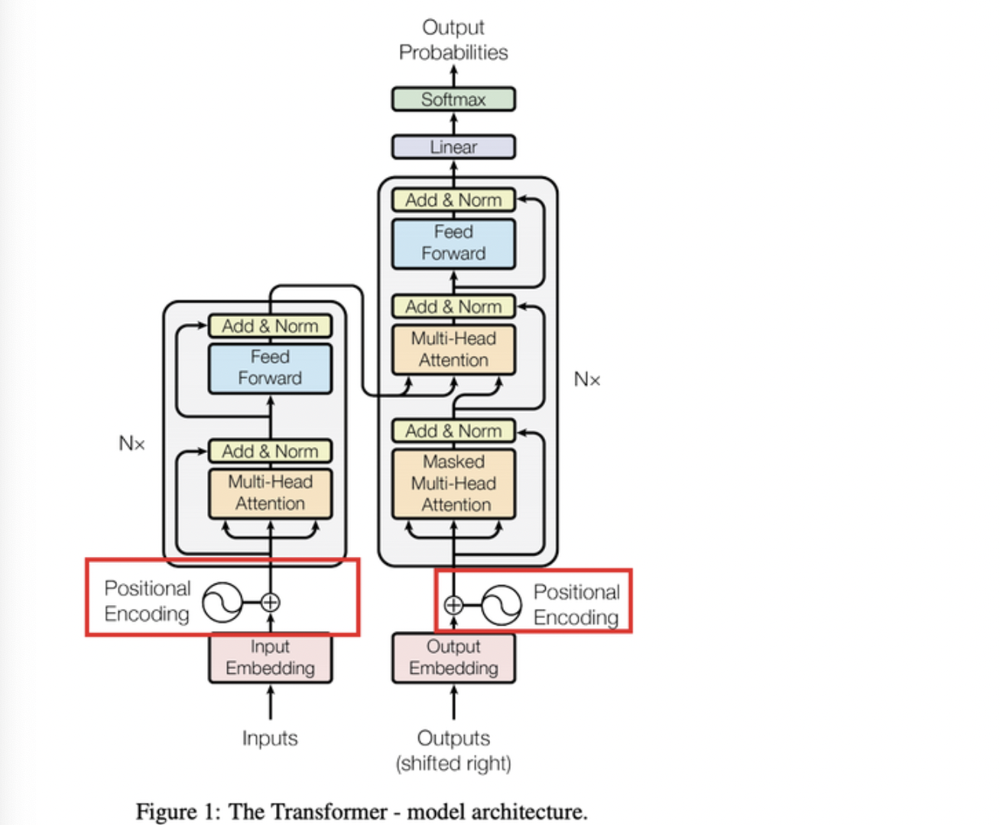

# 10-4. 어텐션? 어텐션!

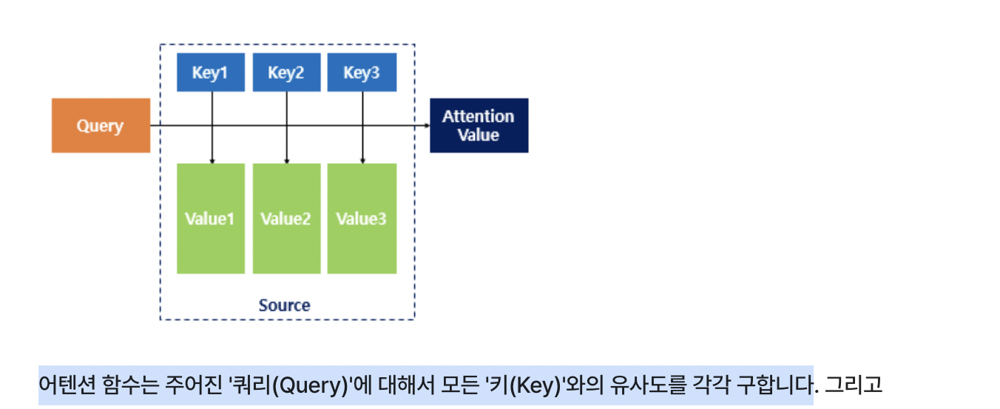
구해낸 이 유사도를 Key와  
맵핑되어있는 각각의 'Value'에 반영해 줍니다.  
그리고 유사도가 반영된 'Value'을 모두 더해서 뭉쳐주면  
이를 최종 결과인 Attention Value

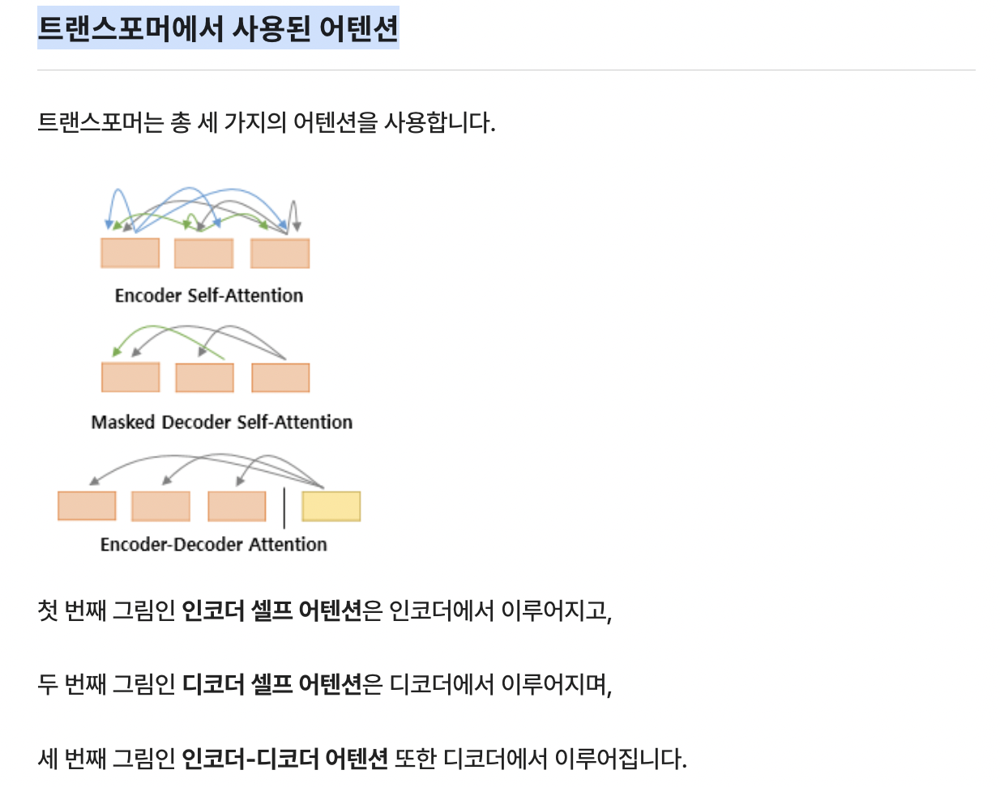

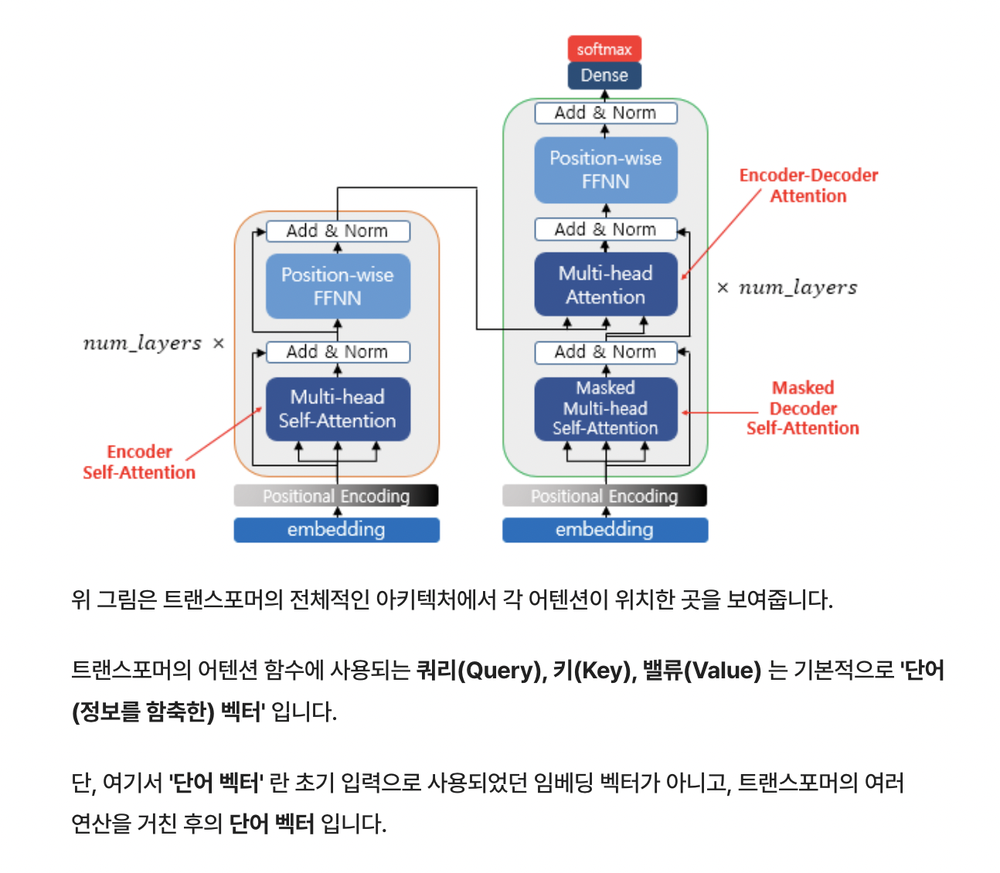

`Encoder self Attention`  
Encoder의 입력으로 들어간 __문장 내 단어들__ 이 서로 유사도를 구한다  

`Decoder self Attention`  
단어를 1개씩 생성하는 Decoder가 __이미 생성된 앞 단어들__ 과의 유사도를 구한다.  

`Encoder-Decoder 어텐션`  
Decoder가 잘! 예측하기 위해서 __Encoder에 입력된 단어들__ 과 유사도를 구한다.
> (Encoder 내 단어와 Decoder 내 단어) 사이에서 유사도

### 셀프 어텐션(Self Attention)
현재 문장 내의 단어들이 서로 유사도를 구하는 경우

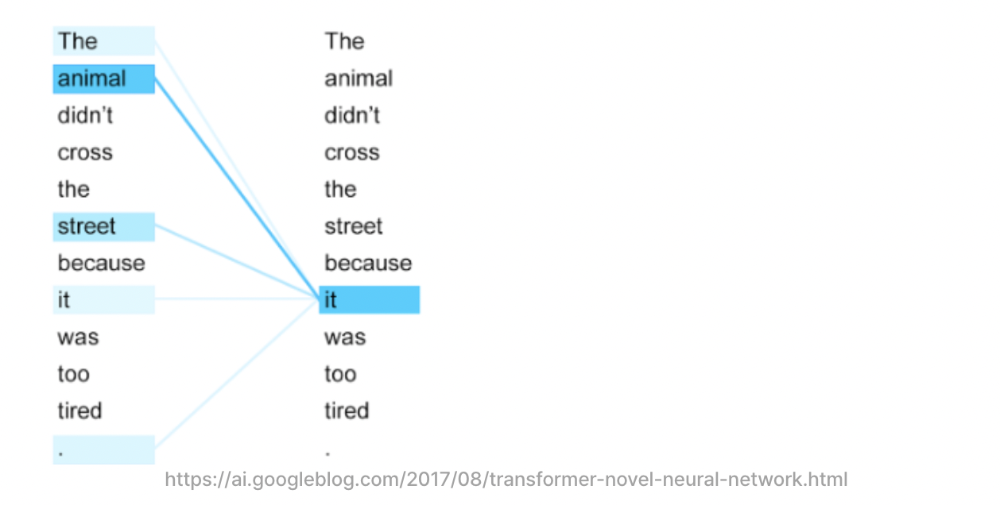
 위의 예시 문장을 번역하면 '그 동물은 길을 건너지 않았다. 왜냐하면 그것은 너무 피곤하였기 때문이다.' 라는 의미가 됩니다.  
 그런데 여기서 it 에 해당하는 것은 과연 street 일까요? animal 일까요?
 
우리는 동물이라는 것을 쉽게 알 수 있지만, 기계는 그렇지 않습니다.  
하지만 셀프 어텐션은 입력 문장 내의 단어들끼리 유사도를 구하여  
it 이 animal 과 연관되었을 확률이 높다는 것을 찾아냅니다.  
그런데 한 가지 의문이 듭니다. 유사도는 어떻게 구할까요?

# 10-5. 스케일드 닷 프로덕트 어텐션
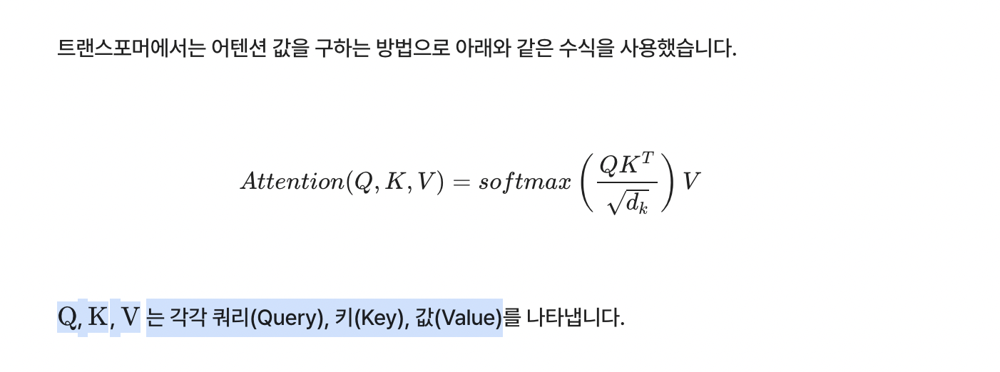
Attention Function는 주어진 'Query'에 대해서 모든 'Key'와의 유사도를 각각 구합니다.  
그리고 구해낸 이 유사도를 Key와 맵핑되어있는 각각의 'Value'에 반영해 줍니다.  
그리고 유사도가 반영된 'Value'을 모두 더해서 뭉쳐주면 이를 최종 결과인`Attention Value`

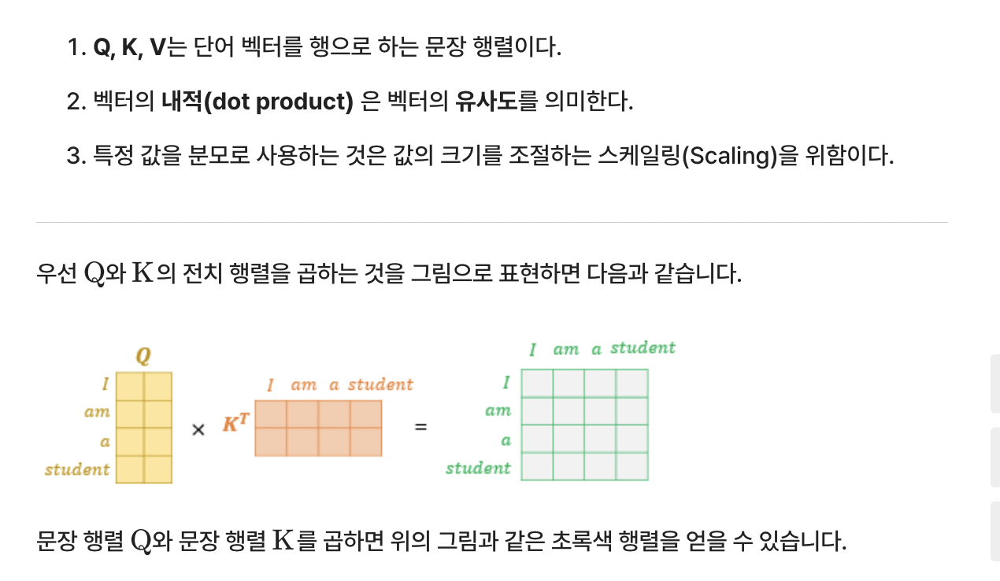
(4,2) * (2,4) -> (4, 4)

위 초록색 행렬이 의미하는 값은 무엇일까요?  
예를 들어 'am' 행과 'student' 열의 값은  
Q 행렬에 있던 'am' 벡터와  
K 행렬에 있던 'student 벡터'의 내적값을 의미합니다.  
결국 각 단어 벡터의 유사도가 모두 기록된 유사도 array이 되는 것이지요!

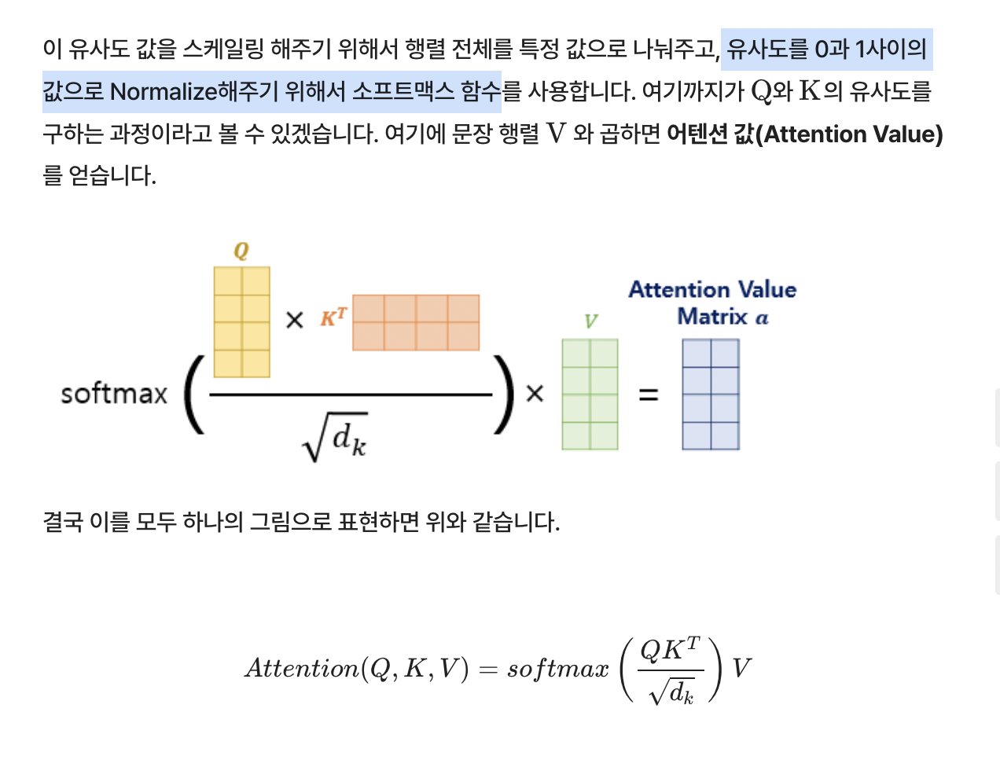

이 수식은 내적(dot product)을 통해 단어 벡터 간 유사도를 구한 후에,  
특정 값을 분모로 나눠주는 방식으로 Q와 K의 유사도를 구하였다고 하여 
>Scaled Dot Product Attention  

만약에 분모에 특정 값을 나눠주는 부분을 사용하지 않았다면 Attention의 이름은 무엇일까요?  
> dot product attention

In [4]:
# 이 글에서 앞으로 어텐션을 수행한다고 한다면, 스케일드 닷 프로덕트 어텐션을 의미합니다!
# 스케일드 닷 프로덕트 어텐션 함수
def scaled_dot_product_attention(query, key, value, mask):
  # 어텐션 가중치는 Q와 K의 닷 프로덕트
  matmul_qk = tf.matmul(query, key, transpose_b=True)

  # 가중치를 정규화
  depth = tf.cast(tf.shape(key)[-1], tf.float32)
  logits = matmul_qk / tf.math.sqrt(depth)

  # 패딩에 마스크 추가
  if mask is not None:
    logits += (mask * -1e9)

  # softmax적용
  attention_weights = tf.nn.softmax(logits, axis=-1)

  # 최종 어텐션은 가중치와 V의 닷 프로덕트
  output = tf.matmul(attention_weights, value)
  return output

# 10-6. 머리가 여러 개인 어텐션
### 병렬로 어텐션 수행하기
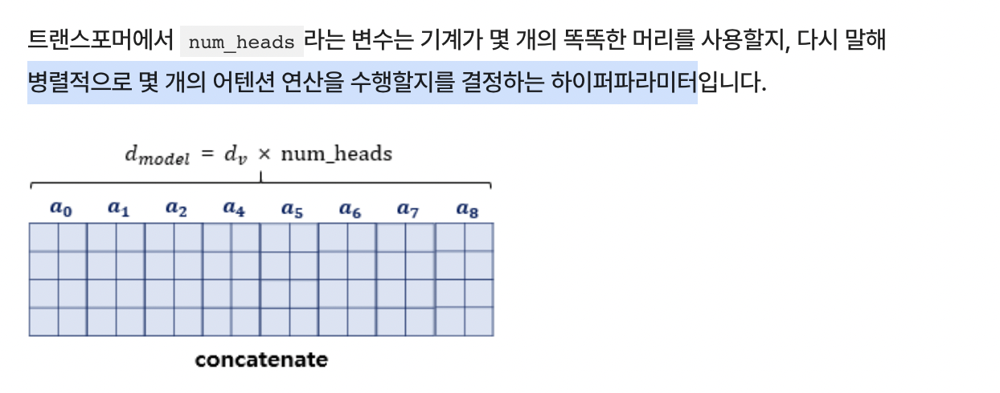

앞서 positional Encoding에서 d_model은 Embedding 벡터의 차원이라고 언급한 바 있습니다.  
결국 Transformer의 초기 입력인 문장 행렬의 크기는  
`문장의 길이를 row`으로, `d_model을 column`의 크기로 가집니다.

Transformer는 이렇게 입력된 문장 행렬을 num_heads의 수만큼 쪼개서 (sdpa)어텐션을 수행하고,  
이렇게 얻은 num_heads의 개수만큼의 어텐션 값 행렬을 다시 하나로 concatenate합니다.

위의 그림은 num_heads가 8개인 경우인데,  
다시 concatenate하면서 `columns의 크기가 d_model`이 됩니다.

각자 문제지를 나눠서 푼 후에  
마지막에 다시 결과를 합친다고 비유해볼 수도 있겠네요!

| Q3. 논문에서 d_model은 512의 값을 가졌다고 하고,  
num_heads는 8의 값을 가졌다고 해요.  
그렇다면, 연결하기 전 8개의 어텐션 값(Attention Value) 행렬의 열의 크기는 몇 차원이었을까요?
512/8 = 64

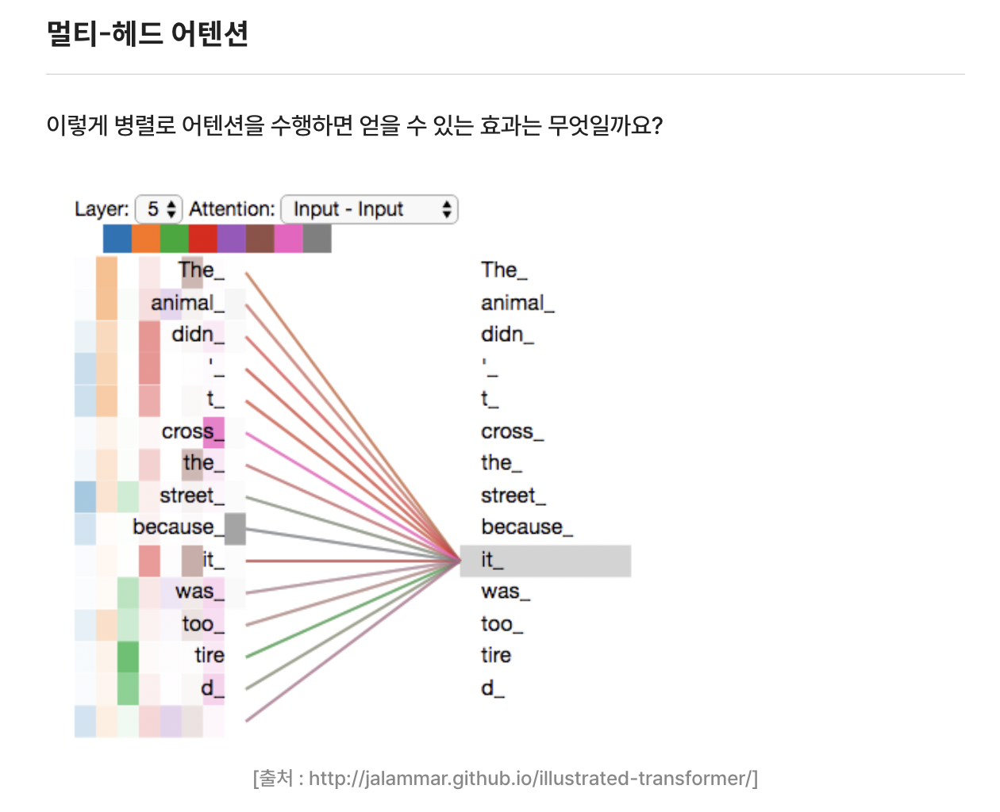
위 그림은 num_heads의 값이 8일 때,  
병렬로 수행되는 어텐션이 서로 다른 셀프 어텐션 결과를 얻을 수 있음을 보여줍니다.  
다시 말해 8개의 머리는 각각 다른 관점에서 (sdpa)어텐션을 수행하므로  
한 번의 (sdpa)어텐션만 수행했다면 놓칠 수도 있던 정보를 캐치할 수 있습니다.  
예를 들어 위 그림에서라면  
it_이라는 토큰이 
animal_과  유사하다고 보는 관점과  
street_과 유사하다고 보는 관점이 한꺼번에 모두 표현 가능하다는 뜻입니다.  

이와 같이 어텐션을 병렬로 수행하는 것을 Multiheaded Attention

In [5]:
# 멀티 헤드 어텐션을 구현하면 다음과 같습니다.

# 내부적으로는 Scasled Dot Product Attention 호출합니다.

class MultiHeadAttention(tf.keras.layers.Layer):

  def __init__(self, d_model, num_heads, name="multi_head_attention"):
    super(MultiHeadAttention, self).__init__(name=name)
    self.num_heads = num_heads
    self.d_model = d_model

    assert d_model % self.num_heads == 0

    self.depth = d_model // self.num_heads

    self.query_dense = tf.keras.layers.Dense(units=d_model)
    self.key_dense = tf.keras.layers.Dense(units=d_model)
    self.value_dense = tf.keras.layers.Dense(units=d_model)

    self.dense = tf.keras.layers.Dense(units=d_model)

  def split_heads(self, inputs, batch_size):
    inputs = tf.reshape(
        inputs, shape=(batch_size, -1, self.num_heads, self.depth))
    return tf.transpose(inputs, perm=[0, 2, 1, 3])

  def call(self, inputs):
    query, key, value, mask = inputs['query'], inputs['key'], inputs[
        'value'], inputs['mask']
    batch_size = tf.shape(query)[0]

    # Q, K, V에 각각 Dense를 적용합니다
    query = self.query_dense(query)
    key = self.key_dense(key)
    value = self.value_dense(value)

    # 병렬 연산을 위한 머리를 여러 개 만듭니다
    query = self.split_heads(query, batch_size)
    key = self.split_heads(key, batch_size)
    value = self.split_heads(value, batch_size)

    # 스케일드 닷 프로덕트 어텐션 함수
    scaled_attention = scaled_dot_product_attention(query, key, value, mask)

    scaled_attention = tf.transpose(scaled_attention, perm=[0, 2, 1, 3])

    # 어텐션 연산 후에 각 결과를 다시 연결(concatenate)합니다
    concat_attention = tf.reshape(scaled_attention,
                                  (batch_size, -1, self.d_model))

    # 최종 결과에도 Dense를 한 번 더 적용합니다
    outputs = self.dense(concat_attention)

    return outputs


# 10-7. Masking
 특정 값들을 가려서 실제 연산에 방해가 되지 않도록 하는 기법
### Padding Masking
1. Padding token
2. Look-ahead masking, 다음 단어 가리기

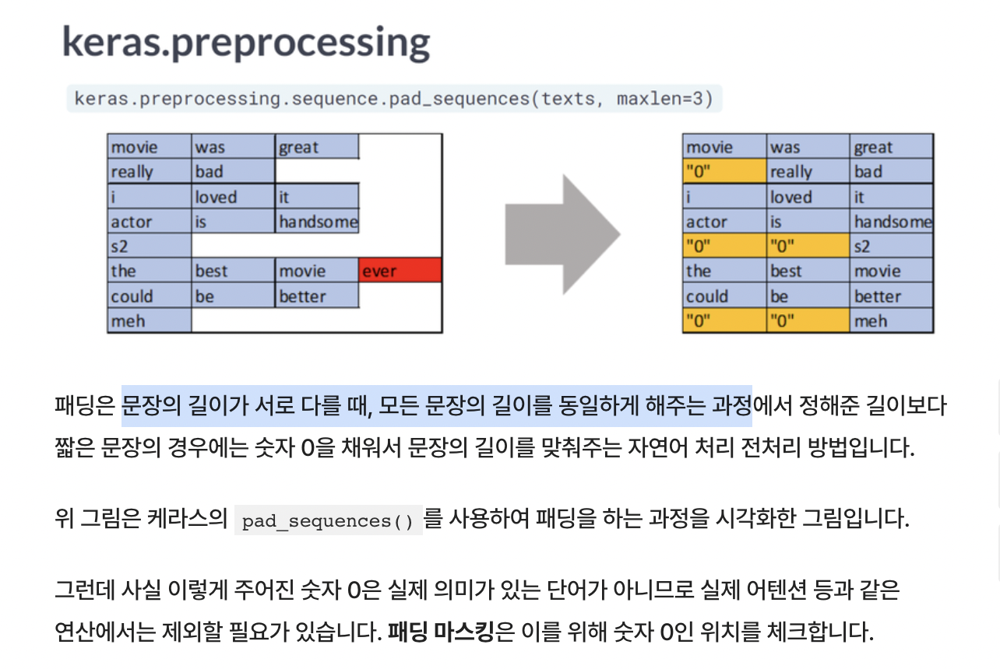

In [6]:
def create_padding_mask(x):
  mask = tf.cast(tf.math.equal(x, 0), tf.float32)
  # (batch_size, 1, 1, sequence length)
  return mask[:, tf.newaxis, tf.newaxis, :]

이 함수에 정수 시퀀스를 입력으로 하면,  
이 함수는 숫자가 0인 부분을 체크한 벡터를 리턴

In [7]:
tf.constant([[1, 2, 0, 3, 0], [0, 0, 0, 4, 5]])

<tf.Tensor: shape=(2, 5), dtype=int32, numpy=
array([[1, 2, 0, 3, 0],
       [0, 0, 0, 4, 5]], dtype=int32)>

In [8]:
create_padding_mask(tf.constant([[1, 2, 0, 3, 0], [0, 0, 0, 4, 5]]))

<tf.Tensor: shape=(2, 1, 1, 5), dtype=float32, numpy=
array([[[[0., 0., 1., 0., 1.]]],


       [[[1., 1., 1., 0., 0.]]]], dtype=float32)>

두 정수 시퀀스에 대해서 각각 결과가 출력되는데,  
오직 숫자가 0인 위치에서만 숫자 1이 나오고  
숫자 0이 아닌 위치에서는 숫자 0인 벡터를 출력  

---
어텐션 연산 시에 padding masking을 참고하면  
불필요하게 숫자 0을 참고하지 않게 할 수 있겠죠?

### Look-ahead masking, 다음 단어 가리기

RNN은 step이라는 개념이 존재해서  
각 step마다 단어가 순서대로 입력으로 들어가는 구조인 반면  

transformer의 경우에는 문장 행렬을 만들어  
한 번에 행렬 형태로 입력으로 들어간다는 특징  
그리고 이 특징 때문에 추가적인 Masking 을 필요  

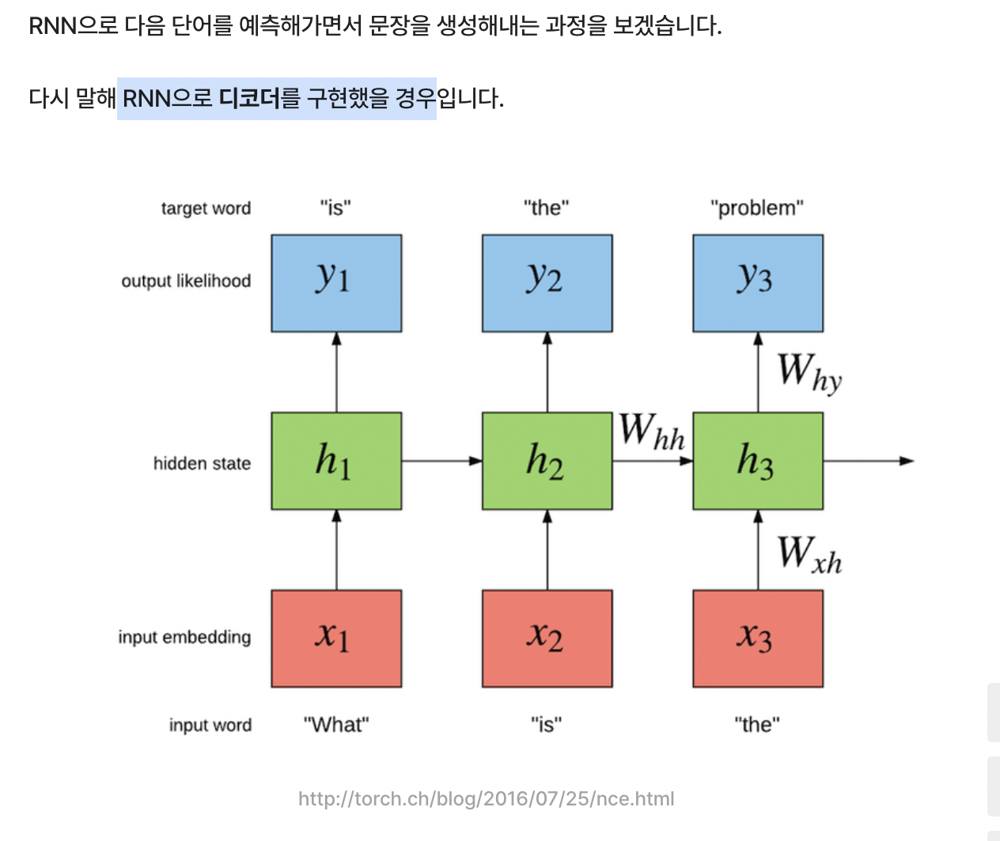
1 번째 step  
현재까지의 입력 : what → 출력 : is  

2 번째 step  
현재까지의 입력 : what is → 출력 : the  

3 번째 step  
현재까지의 입력 : what is the → 출력 problem

### transformer
전체 문장이 문장 행렬로 들어가기 때문에   
위치와 상관없이 모든 단어를 참고해서 다음 단어를 예측할 수 있습니다  

하지만 사실 우리가 원하는 것은  
이전 단어들로부터 다음 단어를 예측하는 훈련을 제대로 하는 것입니다.  
따라서 이러한 문제를 해결하기 위해  
자신보다 다음에 나올 단어를 참고하지 않도록 가리는 기법  
> Look-ahead Masking

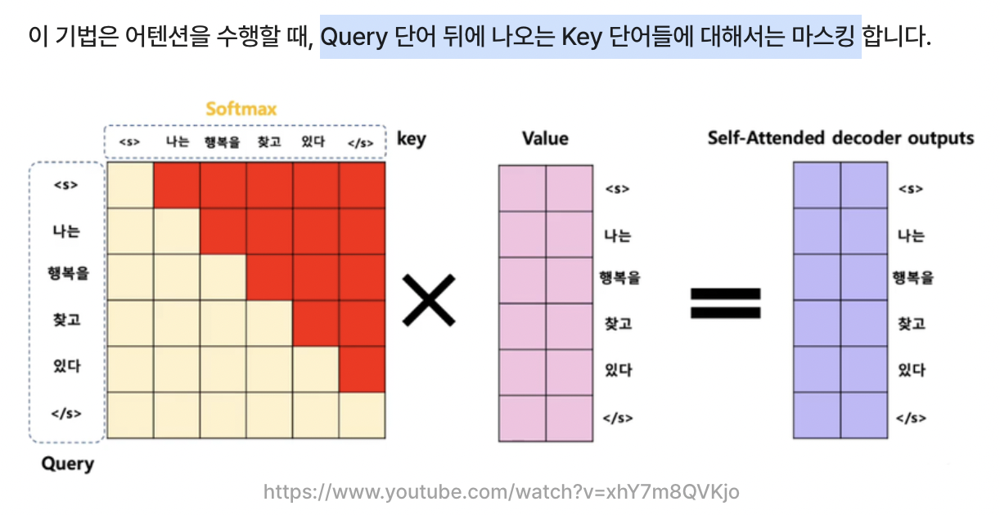

위의 그림에서 빨간색으로 색칠된 부분은 masking을 표현하고 있습니다.  
빨간색은 실제 어텐션 연산에서 가리는 역할을 하여  
어텐션 연산 시에 현재 단어를 기준으로 이전 단어들하고만 유사도를 구할 수 있습니다.  
행을 Query, 열을 Key로 표현된 행렬임을 감안  

예를 들어 Query 단어가 '찾고'라고 한다면,  
이 '찾고'라는 행에는 `<s>, <나는>, <행복을>, <찾고>`까지의 열만 보이고  
그 뒤 열은 아예 빨간색으로 칠해져 있습니다.  
즉, 유사도를 구할 수 없도록 해놓았습니다.  
저 빨간색 부분을 마스킹 함수로 구현하면 다음과 같습니다.

In [7]:
def create_look_ahead_mask(x):
  seq_len = tf.shape(x)[1]
  look_ahead_mask = 1 - tf.linalg.band_part(tf.ones((seq_len, seq_len)), -1, 0)
  padding_mask = create_padding_mask(x)
  return tf.maximum(look_ahead_mask, padding_mask)

In [10]:
tf.constant([[1, 2, 3, 4, 5]])

<tf.Tensor: shape=(1, 5), dtype=int32, numpy=array([[1, 2, 3, 4, 5]], dtype=int32)>

In [11]:
print(create_look_ahead_mask(tf.constant([[1, 2, 3, 4, 5]])))

tf.Tensor(
[[[[0. 1. 1. 1. 1.]
   [0. 0. 1. 1. 1.]
   [0. 0. 0. 1. 1.]
   [0. 0. 0. 0. 1.]
   [0. 0. 0. 0. 0.]]]], shape=(1, 1, 5, 5), dtype=float32)


대각선의 형태로 숫자 1이 채워지는 것을 볼 수 있습니다. 그런데 이 마스킹과 패딩 마스킹은 별개이므로, 이 마스킹을 수행할 때 만약에 숫자 0인 단어가 있다면 이 또한 패딩 해야 합니다.  

그래서 `create_look_ahead_mask()` 함수는 내부적으로 앞서 구현한 패딩 마스크 함수도 호출

In [12]:
# 숫자 0이 포함되었을 경우에도 테스트해 봅시다.
print(create_look_ahead_mask(tf.constant([[0, 5, 1, 5, 5]])))

tf.Tensor(
[[[[1. 1. 1. 1. 1.]
   [1. 0. 1. 1. 1.]
   [1. 0. 0. 1. 1.]
   [1. 0. 0. 0. 1.]
   [1. 0. 0. 0. 0.]]]], shape=(1, 1, 5, 5), dtype=float32)


### 10-8. 인코더
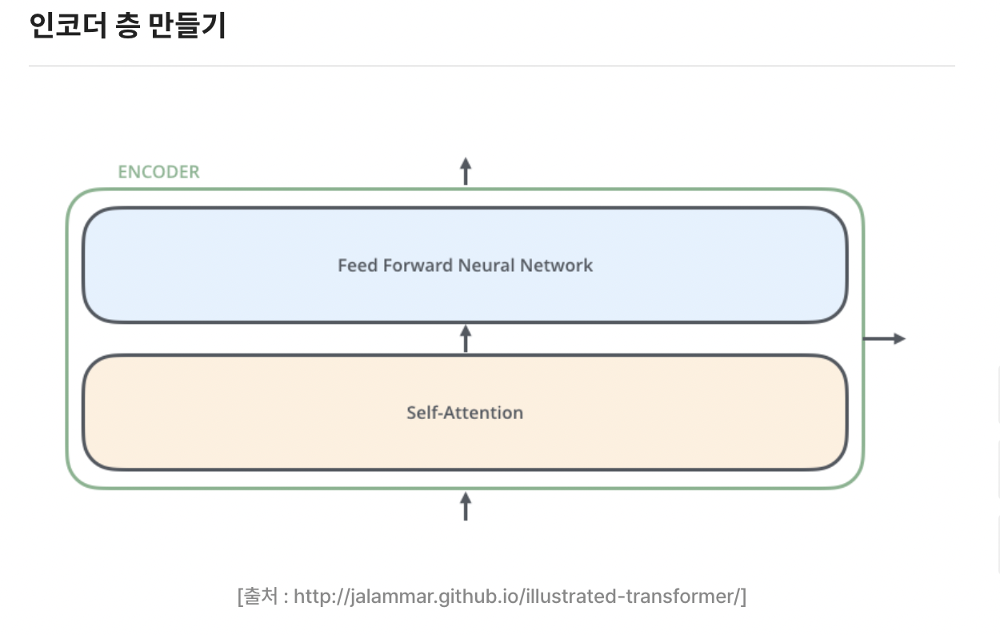

하나의 인코더 층은 크게 총 2개의 서브 층(sublayer)으로 나누어집니다.
바로 셀프 어텐션과 피드 포워드 신경망입니다. self-attention은 Multiheaded Attention으로 병렬적으로

2 개의 서브 층을 가지는 하나의 인코더 층을 구현하는 함수는 다음과 같습니다.  
함수 내부적으로 1 번째 서브 층과 2 번째 서브 층을 구현하고 있습니다.

In [8]:
# 인코더 하나의 레이어를 함수로 구현.
# 이 하나의 레이어 안에는 두 개의 서브 레이어가 존재합니다.
def encoder_layer(units, d_model, num_heads, dropout, name="encoder_layer"):
  inputs = tf.keras.Input(shape=(None, d_model), name="inputs")

  # 패딩 마스크 사용
  padding_mask = tf.keras.Input(shape=(1, 1, None), name="padding_mask")

  # 첫 번째 서브 레이어 : 멀티 헤드 어텐션 수행 (셀프 어텐션)
  attention = MultiHeadAttention(
      d_model, num_heads, name="attention")({
          'query': inputs,
          'key': inputs,
          'value': inputs,
          'mask': padding_mask
      })

  # 어텐션의 결과는 Dropout과 Layer Normalization이라는 훈련을 돕는 테크닉을 수행
  attention = tf.keras.layers.Dropout(rate=dropout)(attention)
  attention = tf.keras.layers.LayerNormalization(
      epsilon=1e-6)(inputs + attention)

  # 두 번째 서브 레이어 : 2개의 완전연결층
  outputs = tf.keras.layers.Dense(units=units, activation='relu')(attention)
  outputs = tf.keras.layers.Dense(units=d_model)(outputs)

  # 완전연결층의 결과는 Dropout과 LayerNormalization이라는 훈련을 돕는 테크닉을 수행
  outputs = tf.keras.layers.Dropout(rate=dropout)(outputs)
  outputs = tf.keras.layers.LayerNormalization(
      epsilon=1e-6)(attention + outputs)

  return tf.keras.Model(
      inputs=[inputs, padding_mask], outputs=outputs, name=name)


슝=3


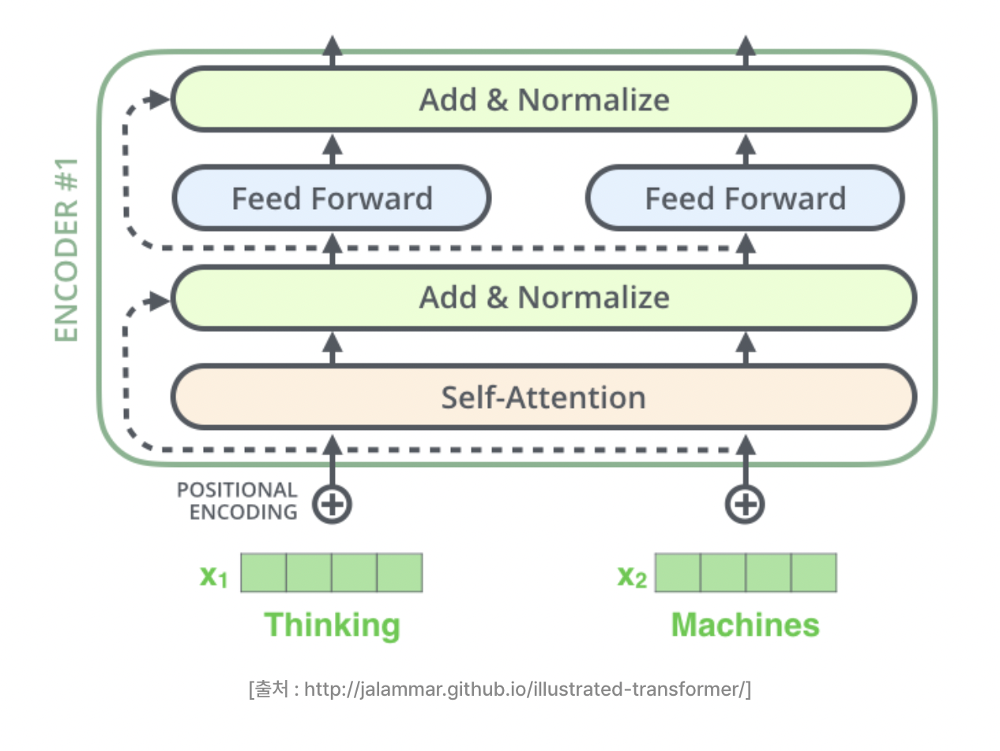

### 인코더 층을 쌓아 인코더 만들기
이렇게 구현한 인코더 층을 Embedding layer 과 Positional Encoding 을 연결하고,  
사용자가 원하는 만큼 인코더 층을 쌓음으로써 transformer의 인코더가 완성됩니다.

인코더와 디코더 내부에서는 각 서브 층 이후에 훈련을 돕는 Layer Normalization이라는 테크닉이 사용되었습니다.  
위 그림에서는 Normalize라고 표시된 부분에 해당됩니다.

transformer는 하이퍼파라미터인 num_layers 개수의 인코더 층을 쌓습니다.  
논문에서는 총 6개의 인코더 층을 사용하였지만, 실습에서는 학습 시간을 고려하여 그보다 적은 개수를 사용할 예정입니다.

In [9]:
def encoder(vocab_size,
            num_layers,
            units,
            d_model,
            num_heads,
            dropout,
            name="encoder"):
  inputs = tf.keras.Input(shape=(None,), name="inputs")

  # 패딩 마스크 사용
  padding_mask = tf.keras.Input(shape=(1, 1, None), name="padding_mask")

  # 임베딩 레이어
  embeddings = tf.keras.layers.Embedding(vocab_size, d_model)(inputs)
  embeddings *= tf.math.sqrt(tf.cast(d_model, tf.float32))

  # 포지셔널 인코딩
  embeddings = PositionalEncoding(vocab_size, d_model)(embeddings)

  outputs = tf.keras.layers.Dropout(rate=dropout)(embeddings)

  # num_layers만큼 쌓아올린 인코더의 층.
  for i in range(num_layers):
    outputs = encoder_layer(
        units=units,
        d_model=d_model,
        num_heads=num_heads,
        dropout=dropout,
        name="encoder_layer_{}".format(i),
    )([outputs, padding_mask])

  return tf.keras.Model(
      inputs=[inputs, padding_mask], outputs=outputs, name=name)


# 10-9. 디코더
디코더는 인코더와 비슷하지만, 인코더보다 조금 더 복잡합니다.  
인코더는 두 개의 서브 층으로 구성되지만,  
디코더는 세 개의 서브 층으로 구성된다는 점이 다릅니다.  
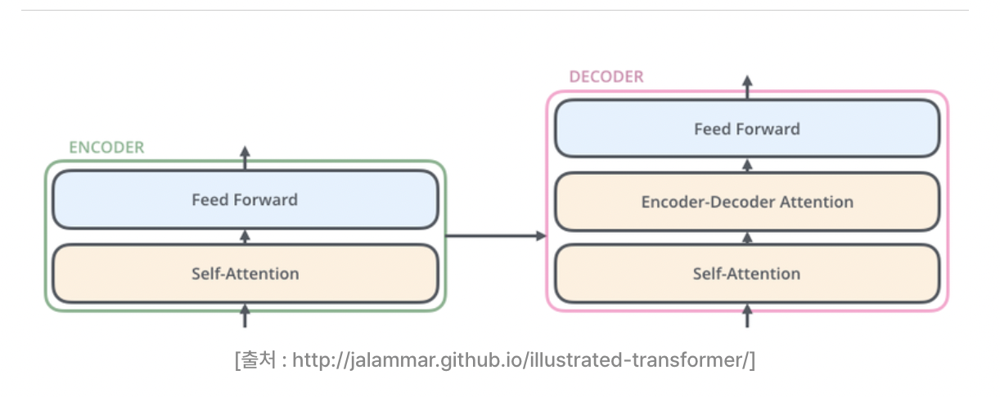  
1 번째는 셀프 어텐션, 2 번째는 인코더-디코더 어텐션, 3 번째는 피드 포워드 신경망입니다.  
인코더-디코더 어텐션은 셀프 어텐션과는 달리, Query가 디코더의 벡터인 반면에  
Key와 Value가 인코더의 벡터라는 특징이 있습니다.  
이 부분이 인코더가 입력 문장으로부터 정보를 디코더에 전달하는 과정입니다.

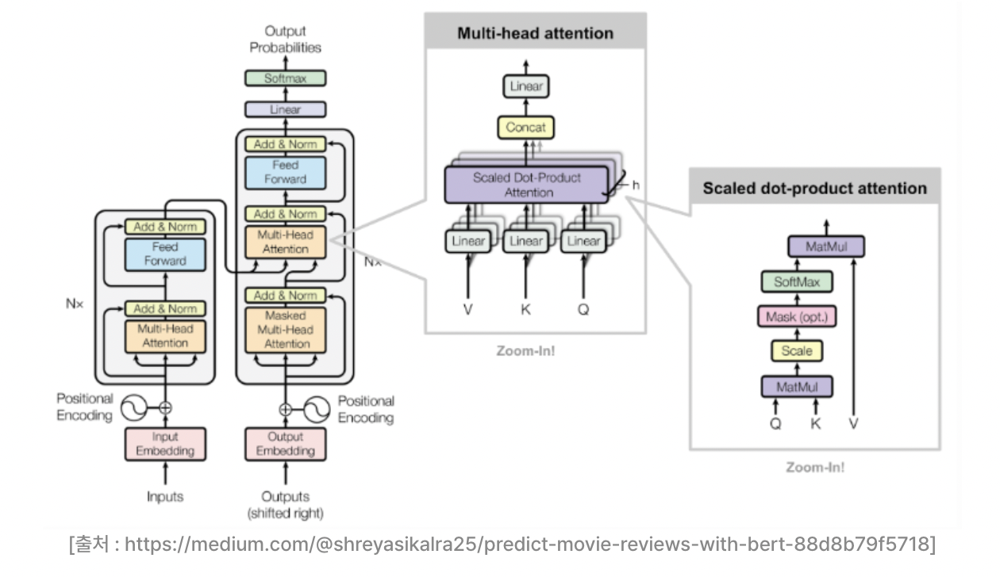 

인코더의 셀프 어텐션과 마찬가지로  
디코더의 셀프 어텐션, 인코더-디코더 어텐션 두 개의 어텐션 모두  
scaled dot product attention을 Multiheaded attention로 병렬적으로 수행합니다.

In [10]:
# 디코더 하나의 레이어를 함수로 구현.
# 이 하나의 레이어 안에는 세 개의 서브 레이어가 존재합니다.
def decoder_layer(units, d_model, num_heads, dropout, name="decoder_layer"):
  inputs = tf.keras.Input(shape=(None, d_model), name="inputs")
  enc_outputs = tf.keras.Input(shape=(None, d_model), name="encoder_outputs")
  look_ahead_mask = tf.keras.Input(
      shape=(1, None, None), name="look_ahead_mask")
  padding_mask = tf.keras.Input(shape=(1, 1, None), name='padding_mask')

  # 첫 번째 서브 레이어 : 멀티 헤드 어텐션 수행 (셀프 어텐션)
  attention1 = MultiHeadAttention(
      d_model, num_heads, name="attention_1")(inputs={
          'query': inputs,
          'key': inputs,
          'value': inputs,
          'mask': look_ahead_mask
      })

  # 멀티 헤드 어텐션의 결과는 LayerNormalization이라는 훈련을 돕는 테크닉을 수행
  attention1 = tf.keras.layers.LayerNormalization(
      epsilon=1e-6)(attention1 + inputs)

  # 두 번째 서브 레이어 : 마스크드 멀티 헤드 어텐션 수행 (인코더-디코더 어텐션)
  attention2 = MultiHeadAttention(
      d_model, num_heads, name="attention_2")(inputs={
          'query': attention1,
          'key': enc_outputs,
          'value': enc_outputs,
          'mask': padding_mask
      })

  # 마스크드 멀티 헤드 어텐션의 결과는
  # Dropout과 LayerNormalization이라는 훈련을 돕는 테크닉을 수행
  attention2 = tf.keras.layers.Dropout(rate=dropout)(attention2)
  attention2 = tf.keras.layers.LayerNormalization(
      epsilon=1e-6)(attention2 + attention1)

  # 세 번째 서브 레이어 : 2개의 완전연결층
  outputs = tf.keras.layers.Dense(units=units, activation='relu')(attention2)
  outputs = tf.keras.layers.Dense(units=d_model)(outputs)

  # 완전연결층의 결과는 Dropout과 LayerNormalization 수행
  outputs = tf.keras.layers.Dropout(rate=dropout)(outputs)
  outputs = tf.keras.layers.LayerNormalization(
      epsilon=1e-6)(outputs + attention2)

  return tf.keras.Model(
      inputs=[inputs, enc_outputs, look_ahead_mask, padding_mask],
      outputs=outputs,
      name=name)


### 디코더 층을 쌓아 디코더 만들기
이렇게 구현한 디코더의 층은 Embedding layer 과 Positional Encoding 을 연결하고,  
사용자가 원하는 만큼 디코더 층을 쌓아 transformer의 Decoder가 완성됩니다.

인코더와 마찬가지로 num_layers 개수의 디코더 층을 쌓습니다.  
논문에서는 총 6개의 디코더 층을 사용하였지만,  
실습에서는 학습 시간을 고려하여 그보다 적은 개수를 사용할 예정입니다.

In [11]:
def decoder(vocab_size,
            num_layers,
            units,
            d_model,
            num_heads,
            dropout,
            name='decoder'):
  inputs = tf.keras.Input(shape=(None,), name='inputs')
  enc_outputs = tf.keras.Input(shape=(None, d_model), name='encoder_outputs')
  look_ahead_mask = tf.keras.Input(
      shape=(1, None, None), name='look_ahead_mask')

  # 패딩 마스크
  padding_mask = tf.keras.Input(shape=(1, 1, None), name='padding_mask')
  
  # 임베딩 레이어
  embeddings = tf.keras.layers.Embedding(vocab_size, d_model)(inputs)
  embeddings *= tf.math.sqrt(tf.cast(d_model, tf.float32))

  # 포지셔널 인코딩
  embeddings = PositionalEncoding(vocab_size, d_model)(embeddings)

  # Dropout이라는 훈련을 돕는 테크닉을 수행
  outputs = tf.keras.layers.Dropout(rate=dropout)(embeddings)

  for i in range(num_layers):
    outputs = decoder_layer(
        units=units,
        d_model=d_model,
        num_heads=num_heads,
        dropout=dropout,
        name='decoder_layer_{}'.format(i),
    )(inputs=[outputs, enc_outputs, look_ahead_mask, padding_mask])

  return tf.keras.Model(
      inputs=[inputs, enc_outputs, look_ahead_mask, padding_mask],
      outputs=outputs,
      name=name)


# 10-10. 챗봇의 병렬 데이터 받아오기

여기서는 Cornell Movie-Dialogs Corpus라는  
영화 및 TV 프로그램에서 사용되었던 대화의 쌍으로 구성된 데이터셋을 사용합니다.  
대화의 쌍이라고 하는 것은 기본적으로 먼저 말하는 사람의 대화 문장이 있고,  
그에 응답하는 대화 문장의 쌍으로 이루어집니다.

데이터를 받아오는 이번 스텝에서 목표로 하는 것은 다음과 같습니다.

1. 정해진 개수인 50,000개의 질문과 답변의 쌍을 추출한다.
2. 문장에서 단어와 구두점 사이에 공백을 추가한다.
3. 알파벳과 ! ? , . 이 4개의 구두점을 제외하고 다른 특수문자는 모두 제거한다.

In [12]:
path_to_zip = tf.keras.utils.get_file(
    'cornell_movie_dialogs.zip',
    origin='http://www.cs.cornell.edu/~cristian/data/cornell_movie_dialogs_corpus.zip',
    extract=True)

path_to_dataset = os.path.join(
    os.path.dirname(path_to_zip), "cornell movie-dialogs corpus")

path_to_movie_lines = os.path.join(path_to_dataset, 'movie_lines.txt')
path_to_movie_conversations = os.path.join(path_to_dataset,'movie_conversations.txt')


In [13]:
# 사용할 샘플의 최대 개수
MAX_SAMPLES = 50000

이번 전처리는 (Regular Expression) 을 사용하여 (punctuation) 을 제거하여  
단어를 (tokenizing) 하는 일에 방해가 되지 않도록 정제하는 것을 목표로 합니다.

In [14]:
# 전처리 함수
def preprocess_sentence(sentence):
  sentence = sentence.lower().strip()

  # 단어와 구두점(punctuation) 사이의 거리를 만듭니다.
  # 예를 들어서 "I am a student." => "I am a student ."와 같이
  # student와 온점 사이에 거리를 만듭니다.
  sentence = re.sub(r"([?.!,])", r" \1 ", sentence)
  sentence = re.sub(r'[" "]+', " ", sentence)

  # (a-z, A-Z, ".", "?", "!", ",")를 제외한 모든 문자를 공백인 ' '로 대체합니다.
  sentence = re.sub(r"[^a-zA-Z?.!,]+", " ", sentence)
  sentence = sentence.strip()
  return sentence

In [15]:
# 질문과 답변의 쌍인 데이터셋을 구성하기 위한 데이터 로드 함수
def load_conversations():
  id2line = {}
  with open(path_to_movie_lines, errors='ignore') as file:
    lines = file.readlines()
  for line in lines:
    parts = line.replace('\n', '').split(' +++$+++ ')
    id2line[parts[0]] = parts[4]

  inputs, outputs = [], []
  with open(path_to_movie_conversations, 'r') as file:
    lines = file.readlines()

  for line in lines:
    parts = line.replace('\n', '').split(' +++$+++ ')
    conversation = [line[1:-1] for line in parts[3][1:-1].split(', ')]

    for i in range(len(conversation) - 1):
      # 전처리 함수를 질문에 해당되는 inputs와 답변에 해당되는 outputs에 적용.
      inputs.append(preprocess_sentence(id2line[conversation[i]]))
      outputs.append(preprocess_sentence(id2line[conversation[i + 1]]))

      if len(inputs) >= MAX_SAMPLES:
        return inputs, outputs
  return inputs, outputs

In [16]:
# 데이터를 로드하고 전처리하여 질문을 questions, 답변을 answers에 저장합니다.
questions, answers = load_conversations()
print('전체 샘플 수 :', len(questions))
print('전체 샘플 수 :', len(answers))

전체 샘플 수 : 50000
전체 샘플 수 : 50000


질문과 답변은 병렬적으로 구성되는 데이터셋이므로 두 샘플 수는 정확하게 일치해야 합니다.

둘 다 5만 개의 샘플이 저장되었습니다.

임의로 22번째 샘플(인덱스 상으로는 21번 샘플)을 출력해서  
질문과 답변이 병렬적으로 잘 저장은 되었는지,  
그리고 전처리 함수에서 의도했던 전처리가 진행되었는지 확인해 봅시다!

In [22]:
print('전처리 후의 22번째 질문 샘플: {}'.format(questions[22]))
print('전처리 후의 22번째 답변 샘플: {}'.format(answers[22]))

전처리 후의 22번째 질문 샘플: lesbian ? no . i found a picture of jared leto in one of her drawers , so i m pretty sure she s not harboring same sex tendencies .
전처리 후의 22번째 답변 샘플: so that s the kind of guy she likes ? pretty ones ?


?나 .과 같은 구두점들이 단어들과 분리되어 단어와 구두점 사이에는 공백이 추가된 것을 확인할 수 있습니다.  
이렇게 함으로써 단어를 토크나이징 하는 과정에서 구두점과 붙어있던 단어들을 하나의 단어로 인식하는 것을 방지할 수 있습니다.

# 10-11. 병렬 데이터 전처리하기
1. TensorFlow Datasets SubwordTextEncoder 를 토크나이저로 사용한다.   
    단어보다 더 작은 단위인 Subword를 기준으로 tokenizing토크나이징하고,   
        각 토큰을 고유한 정수로 인코딩 한다.
2. 각 문장을 토큰화하고 각 문장의 START_TOKEN 및 END_TOKEN을 추가  
3. MAX_LENGTH 인 over 40을  문장들은 필터링한다.
4. less 40 문장들은 40에 맞도록 패딩 한다.

### 1. 단어장(Vocabulary) 만들기
우선 각 단어에 고유한 정수 인덱스를 부여하기 위해서  
단어장(Vocabulary)을 만들어보겠습니다.  
단어장을 만들 때는 질문과 답변 데이터셋을 모두 사용하여 만듭니다.

In [17]:
import tensorflow_datasets as tfds

# 질문과 답변 데이터셋에 대해서 Vocabulary 생성
tokenizer = tfds.deprecated.text.SubwordTextEncoder.build_from_corpus(questions + answers, target_vocab_size=2**13)


이때 디코더의 문장 생성 과정에서 사용할 START_TOKEN 및 END_TOKEN에 대해서도  
임의로 단어장에 추가하여서 정수를 부여해 줍니다.  
이미 생성된 단어장의 번호와 겹치지 않도록  
각각 단어장의 크기와 그보다 1이 큰 수를 번호로 부여하면 되겠죠?  

In [24]:
len(tokenizer.subwords)
# [' .',
#  ' . ',
#  ' , ',
#  'i_',
#  'you_',
#  'the_',
#  ' ?',
#  's_',
#  'to_',
#  'a_',

8074

In [25]:
tokenizer.vocab_size

8331

In [18]:
###### 시작 토큰과 종료 토큰에 고유한 정수를 부여합니다.
START_TOKEN, END_TOKEN = [tokenizer.vocab_size], [tokenizer.vocab_size + 1]

print('START_TOKEN의 번호 :' ,[tokenizer.vocab_size])
print('END_TOKEN의 번호 :' ,[tokenizer.vocab_size + 1])

START_TOKEN의 번호 : [8331]
END_TOKEN의 번호 : [8332]


???? 각각 +1 해야하는 거 아닌가???? 설마.. 해당 번호에 start end 넣는건가????  
각각 8,331과 8,332라는 점에서   
현재 단어장의 크기가 8,331(0번 ~ 8,330번)

두 개의 토큰을 추가해 주었기 때문에  
단어장의 크기도 +2임을 명시해 주어야 합니다.

In [19]:
####### 시작 토큰과 종료 토큰을 고려하여 +2를 하여 단어장의 크기를 산정합니다.
VOCAB_SIZE = tokenizer.vocab_size + 2
print(VOCAB_SIZE)

8333


### 2. 각 단어를 고유한 정수로 인코딩(Integer encoding) & 패딩(Padding)
위에서 tensorflow_datasets의 SubwordTextEncoder를 사용해서 
tokenizer를 정의하고 Vocabulary를 만들었다면,  
tokenizer.encode()로 각 단어를 정수로 변환할 수 있고  
또는 tokenizer.decode()를 통해 int seq -> word seq로 변환할 수 있습니다.  

e.g. 22번째 샘플을 tokenizer.encode()의 입력으로 사용해서 변환 결과를 봅시다.  

In [28]:
# 임의의 22번째 샘플에 대해서 정수 인코딩 작업을 수행.
# 각 토큰을 고유한 정수로 변환
print('정수 인코딩 후의 21번째 질문 샘플: {}'.format(tokenizer.encode(questions[21])))
print('정수 인코딩 후의 21번째 답변 샘플: {}'.format(tokenizer.encode(answers[21])))

정수 인코딩 후의 21번째 질문 샘플: [60, 8, 37, 8172, 49]
정수 인코딩 후의 21번째 답변 샘플: [7824, 1223, 19, 61, 2, 4, 336, 10, 1595, 14, 1104, 698, 3263, 263, 16, 71, 14, 107, 2133, 900, 3, 59, 4, 23, 355, 204, 60, 8, 37, 885, 2289, 8107, 344, 1001, 5179, 4214, 342, 1]


In [29]:
len(questions), len(answers)

(50000, 50000)

In [30]:
questions[-1], answers[-1]

('yeah , maybe move that nurse in . she don t seem the type to keep you awake praying .',
 'i have been in this army a long time . i know just what you guys are up to . but there are limits . . .')

각 단어에 고유한 정수가 부여된 Vocabulary를 기준으로  
word seq가 int seq로 Encodeing된 결과를 확인할 수 있습니다.  
위의 결과와 마찬가지로 질문과 답변 셋에 대해서 전부 int Encoding 을 수행  
이와 동시에 문장의 max len를 정하고, 해당 길이로 padding 합니다.

In [20]:
# 샘플의 최대 허용 길이 또는 패딩 후의 최종 길이
MAX_LENGTH = 40
# print(MAX_LENGTH)

In [21]:
# 정수 인코딩, 최대 길이를 초과하는 샘플 제거, 패딩
def tokenize_and_filter(inputs, outputs):
  tokenized_inputs, tokenized_outputs = [], []
  
  for (sentence1, sentence2) in zip(inputs, outputs):
    # 정수 인코딩 과정에서 시작 토큰과 종료 토큰을 추가
    sentence1 = START_TOKEN + tokenizer.encode(sentence1) + END_TOKEN
    sentence2 = START_TOKEN + tokenizer.encode(sentence2) + END_TOKEN

    # 최대 길이 40 이하인 경우에만 데이터셋으로 허용
    if len(sentence1) <= MAX_LENGTH and len(sentence2) <= MAX_LENGTH:
      tokenized_inputs.append(sentence1)
      tokenized_outputs.append(sentence2)
  
  # 최대 길이 40으로 모든 데이터셋을 패딩
  tokenized_inputs = tf.keras.preprocessing.sequence.pad_sequences(
      tokenized_inputs, maxlen=MAX_LENGTH, padding='post')
  tokenized_outputs = tf.keras.preprocessing.sequence.pad_sequences(
      tokenized_outputs, maxlen=MAX_LENGTH, padding='post')
  
  return tokenized_inputs, tokenized_outputs


정수 인코딩 과정을 수행하면서 샘플의 길이가 over 40는 샘플들을 필터링하였으므로  
일부 샘플이 제외되었습니다.  
단어장의 크기와 샘플의 개수를 확인해 보겠습니다.  

In [22]:
questions, answers = tokenize_and_filter(questions, answers)
print('단어장의 크기 :',(VOCAB_SIZE))
print('필터링 후의 질문 샘플 개수: {}'.format(len(questions)))
print('필터링 후의 답변 샘플 개수: {}'.format(len(answers)))

단어장의 크기 : 8333
필터링 후의 질문 샘플 개수: 44095
필터링 후의 답변 샘플 개수: 44095


### 3. Teacher Forcing 사용하기
tf.data.Dataset API 는 훈련 프로세스의 속도가 빨라지도록  
input pipeline파을 구축하는 API입니다.

이를 적극 사용하기 위해서 질문과 답변의 쌍을 `tf.data.Dataset`의 입력으로 넣어주는 작업  

이때, 디코더의 입력과 실제값(Label)을 정의해 주기 위해서는  
Teacher Forcing 이라는 언어 모델의 훈련 기법을 이해해야만 합니다.  
아래의 글을 통해 교사 강요에 대해 알아봅시다. 
https://wikidocs.net/46496

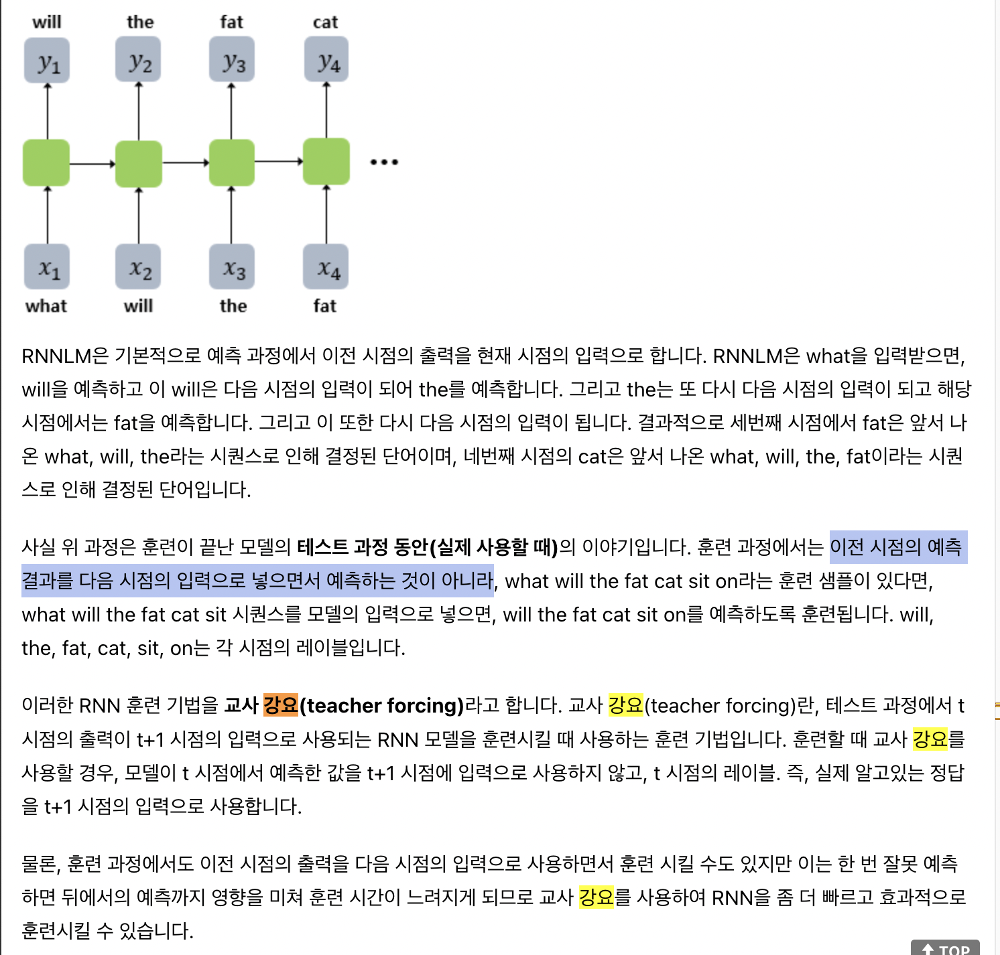

이전 자신의 출력이 현재 자신의 상태를 결정하는 모델을  
- 자기회귀 모델(auto-regressive model, AR)    

앞서 Teacher Forcing를 이해하기 위해 읽었던 글에 등장한 RNN 언어 모델은  
대표적인 Auto-Regressive model의 예이며,  
transformer의 decoder 또한 Auto-regressive model  

질문과 답변의 쌍을 tf.data.Dataset API의 입력으로 사용하여 파이프라인을 구성합니다.  

이때, Teacher Forcing를 위해서  
answers[:, :-1]를 디코더의 입력값,  
answers[:, 1:]를 디코더의 레이블로 사용합니다.

In [23]:
BATCH_SIZE = 64
BUFFER_SIZE = 20000

# 디코더는 이전의 target을 다음의 input으로 사용합니다.
# 이에 따라 outputs에서는 START_TOKEN을 제거하겠습니다.
dataset = tf.data.Dataset.from_tensor_slices((
    {
        'inputs': questions,
        'dec_inputs': answers[:, :-1]
    },
    {
        'outputs': answers[:, 1:]
    },
))

dataset = dataset.cache()
dataset = dataset.shuffle(BUFFER_SIZE)
dataset = dataset.batch(BATCH_SIZE)
dataset = dataset.prefetch(tf.data.experimental.AUTOTUNE)


In [35]:
dataset

<PrefetchDataset shapes: ({inputs: (None, 40), dec_inputs: (None, 39)}, {outputs: (None, 39)}), types: ({inputs: tf.int32, dec_inputs: tf.int32}, {outputs: tf.int32})>

In [36]:
## 8331 start # 8332 end
answers[:, :-1], questions, answers[:, 1:]

(array([[8331,   72,    3, ...,    0,    0,    0],
        [8331,   37,    6, ...,    0,    0,    0],
        [8331,  135,   25, ...,    0,    0,    0],
        ...,
        [8331,  108,   32, ...,    0,    0,    0],
        [8331,   43,   71, ...,    0,    0,    0],
        [8331,    4,   30, ...,    0,    0,    0]], dtype=int32),
 array([[8331,   38,   18, ...,    1, 8332,    0],
        [8331,   72,    3, ...,    0,    0,    0],
        [8331,   37,    6, ...,    0,    0,    0],
        ...,
        [8331,  207,    2, ...,    0,    0,    0],
        [8331,    4,  292, ...,    0,    0,    0],
        [8331,   78,    3, ...,    0,    0,    0]], dtype=int32),
 array([[  72,    3,    4, ...,    0,    0,    0],
        [  37,    6, 4414, ...,    0,    0,    0],
        [ 135,   25,  114, ...,    0,    0,    0],
        ...,
        [ 108,   32, 1275, ...,    0,    0,    0],
        [  43,   71,   24, ...,    0,    0,    0],
        [   4,   30,   89, ...,    0,    0,    0]], dtype=int32)

# 10-12. 모델 정의 및 학습하기

In [24]:
def transformer(vocab_size,
                num_layers,
                units,
                d_model,
                num_heads,
                dropout,
                name="transformer"):
  inputs = tf.keras.Input(shape=(None,), name="inputs")
  dec_inputs = tf.keras.Input(shape=(None,), name="dec_inputs")

  # 인코더에서 패딩을 위한 마스크
  enc_padding_mask = tf.keras.layers.Lambda(
      create_padding_mask, output_shape=(1, 1, None),
      name='enc_padding_mask')(inputs)

  # 디코더에서 미래의 토큰을 마스크 하기 위해서 사용합니다.
  # 내부적으로 패딩 마스크도 포함되어져 있습니다.
  look_ahead_mask = tf.keras.layers.Lambda(
      create_look_ahead_mask,
      output_shape=(1, None, None),
      name='look_ahead_mask')(dec_inputs)

  # 두 번째 어텐션 블록에서 인코더의 벡터들을 마스킹
  # 디코더에서 패딩을 위한 마스크
  dec_padding_mask = tf.keras.layers.Lambda(
      create_padding_mask, output_shape=(1, 1, None),
      name='dec_padding_mask')(inputs)

  # 인코더
  enc_outputs = encoder(
      vocab_size=vocab_size,
      num_layers=num_layers,
      units=units,
      d_model=d_model,
      num_heads=num_heads,
      dropout=dropout,
  )(inputs=[inputs, enc_padding_mask])

  # 디코더
  dec_outputs = decoder(
      vocab_size=vocab_size,
      num_layers=num_layers,
      units=units,
      d_model=d_model,
      num_heads=num_heads,
      dropout=dropout,
  )(inputs=[dec_inputs, enc_outputs, look_ahead_mask, dec_padding_mask])

  # 완전연결층
  outputs = tf.keras.layers.Dense(units=vocab_size, name="outputs")(dec_outputs)

  return tf.keras.Model(inputs=[inputs, dec_inputs], outputs=outputs, name=name)


### 1. 모델 생성
num_layers, d-Model, units는 전부 사용자가 정할 수 있는 하이퍼파라미터 값입니다.

논문에서 num_layers는 6, d-Model은 512였지만,  
빠르고 원활한 훈련을 위해 여기서는 각 하이퍼파라미터를 논문에서보다는 작은 값을 사용합니다.

In [25]:
tf.keras.backend.clear_session()

# 하이퍼파라미터
NUM_LAYERS = 2 # 인코더와 디코더의 층의 개수
D_MODEL = 256 # 인코더와 디코더 내부의 입, 출력의 고정 차원
NUM_HEADS = 8 # 멀티 헤드 어텐션에서의 헤드 수 
UNITS = 512 # 피드 포워드 신경망의 은닉층의 크기
DROPOUT = 0.1 # 드롭아웃의 비율

model = transformer(
    vocab_size=VOCAB_SIZE,
    num_layers=NUM_LAYERS,
    units=UNITS,
    d_model=D_MODEL,
    num_heads=NUM_HEADS,
    dropout=DROPOUT)

model.summary()

Model: "transformer"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
inputs (InputLayer)             [(None, None)]       0                                            
__________________________________________________________________________________________________
dec_inputs (InputLayer)         [(None, None)]       0                                            
__________________________________________________________________________________________________
enc_padding_mask (Lambda)       (None, 1, 1, None)   0           inputs[0][0]                     
__________________________________________________________________________________________________
encoder (Functional)            (None, None, 256)    3187456     inputs[0][0]                     
                                                                 enc_padding_mask[0][0] 

### 2. 손실 함수(Loss function)
레이블인 시퀀스에 패딩이 되어 있으므로,  
loss를 계산할 때 패딩 마스크를 적용해야 합니다.

In [26]:
def loss_function(y_true, y_pred):
  y_true = tf.reshape(y_true, shape=(-1, MAX_LENGTH - 1))
  
  loss = tf.keras.losses.SparseCategoricalCrossentropy(
      from_logits=True, reduction='none')(y_true, y_pred)

  mask = tf.cast(tf.not_equal(y_true, 0), tf.float32)
  loss = tf.multiply(loss, mask)

  return tf.reduce_mean(loss)

### 3. 커스텀 된 학습률(Learning rate)
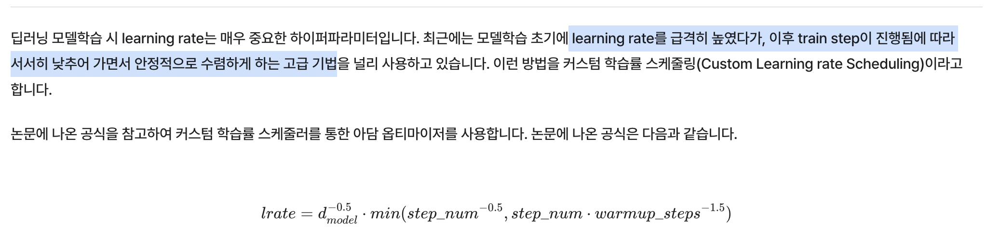

In [27]:
class CustomSchedule(tf.keras.optimizers.schedules.LearningRateSchedule):

  def __init__(self, d_model, warmup_steps=4000):
    super(CustomSchedule, self).__init__()

    self.d_model = d_model
    self.d_model = tf.cast(self.d_model, tf.float32)

    self.warmup_steps = warmup_steps

  def __call__(self, step):
    arg1 = tf.math.rsqrt(step)
    arg2 = step * (self.warmup_steps**-1.5)

    return tf.math.rsqrt(self.d_model) * tf.math.minimum(arg1, arg2)

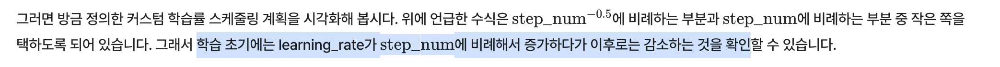

In [28]:
import seaborn as sns
sns.set(style='whitegrid')

Text(0.5, 0, 'Train Step')

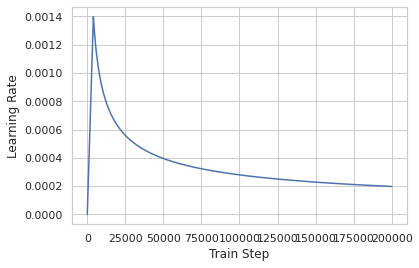

In [29]:
sample_learning_rate = CustomSchedule(d_model=128)

plt.plot(sample_learning_rate(tf.range(200000, dtype=tf.float32)))
plt.ylabel("Learning Rate")
plt.xlabel("Train Step")

### 4. 모델 컴파일

In [30]:
learning_rate = CustomSchedule(D_MODEL)

optimizer = tf.keras.optimizers.Adam(
    learning_rate, beta_1=0.9, beta_2=0.98, epsilon=1e-9)

def accuracy(y_true, y_pred):
  y_true = tf.reshape(y_true, shape=(-1, MAX_LENGTH - 1))
  return tf.keras.metrics.sparse_categorical_accuracy(y_true, y_pred)

model.compile(optimizer=optimizer, loss=loss_function, metrics=[accuracy])


In [31]:
ckpt = tf.keras.callbacks.ModelCheckpoint(filepath="./{epoch}-{loss:.2f}-{accuracy:.2f}.h5", 
                                          monitor='loss',
                                          mode='min',
                                        save_best_only=True, # if False, save every epoch
                                        save_weights_only=False)#weight & layer

### 5. 훈련하기

In [45]:
len(dataset), dataset

(689,
 <PrefetchDataset shapes: ({inputs: (None, 40), dec_inputs: (None, 39)}, {outputs: (None, 39)}), types: ({inputs: tf.int32, dec_inputs: tf.int32}, {outputs: tf.int32})>)

In [34]:
EPOCHS = 10
model.fit(dataset, epochs=EPOCHS, verbose=1) #, 
#           callbacks=[ckpt])

Epoch 1/10
689/689 [==============================] - 37s 54ms/step - loss: 1.4994 - accuracy: 0.0789
Epoch 2/10
689/689 [==============================] - 38s 55ms/step - loss: 1.3939 - accuracy: 0.0860
Epoch 3/10
689/689 [==============================] - 38s 55ms/step - loss: 1.3346 - accuracy: 0.0904
Epoch 4/10
689/689 [==============================] - 38s 55ms/step - loss: 1.2832 - accuracy: 0.0943
Epoch 5/10
689/689 [==============================] - 38s 55ms/step - loss: 1.2365 - accuracy: 0.0981
Epoch 6/10
689/689 [==============================] - 38s 56ms/step - loss: 1.1817 - accuracy: 0.1022
Epoch 7/10
689/689 [==============================] - 38s 55ms/step - loss: 1.1192 - accuracy: 0.1077
Epoch 8/10
689/689 [==============================] - 38s 55ms/step - loss: 1.0618 - accuracy: 0.1133
Epoch 9/10
689/689 [==============================] - 38s 55ms/step - loss: 1.0082 - accuracy: 0.1191
Epoch 10/10
689/689 [==============================] - 38s 55ms/step - loss: 0.958

# 10-13. 챗봇 테스트하기
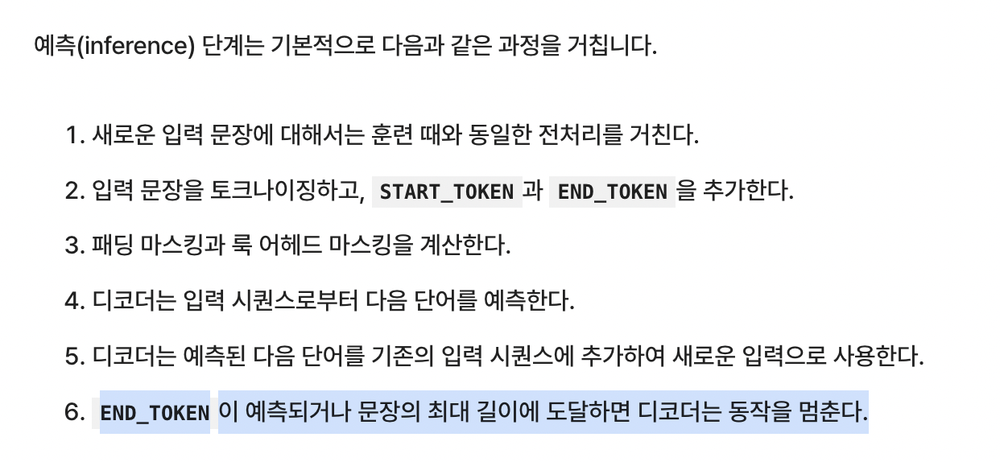

In [35]:
def decoder_inference(sentence):
  sentence = preprocess_sentence(sentence)

  # 입력된 문장을 정수 인코딩 후, 시작 토큰과 종료 토큰을 앞뒤로 추가.
  # ex) Where have you been? → [[8331   86   30    5 1059    7 8332]]
  sentence = tf.expand_dims(
      START_TOKEN + tokenizer.encode(sentence) + END_TOKEN, axis=0)

  # 디코더의 현재까지의 예측한 출력 시퀀스가 지속적으로 저장되는 변수.
  # 처음에는 예측한 내용이 없음으로 시작 토큰만 별도 저장. ex) 8331
  output_sequence = tf.expand_dims(START_TOKEN, 0)

  # 디코더의 인퍼런스 단계
  for i in range(MAX_LENGTH):
    # 디코더는 최대 MAX_LENGTH의 길이만큼 다음 단어 예측을 반복합니다.
    predictions = model(inputs=[sentence, output_sequence], training=False)
    predictions = predictions[:, -1:, :]

    # 현재 예측한 단어의 정수
    predicted_id = tf.cast(tf.argmax(predictions, axis=-1), tf.int32)

    # 만약 현재 예측한 단어가 종료 토큰이라면 for문을 종료
    if tf.equal(predicted_id, END_TOKEN[0]):
      break

    # 예측한 단어들은 지속적으로 output_sequence에 추가됩니다.
    # 이 output_sequence는 다시 디코더의 입력이 됩니다.
    output_sequence = tf.concat([output_sequence, predicted_id], axis=-1)

  return tf.squeeze(output_sequence, axis=0)

임의의 입력 문장에 대해서 decoder_inference() 함수를 호출하여  
챗봇의 대답을 얻는 sentence_generation() 함수를 만듭니다.

In [36]:
def sentence_generation(sentence):
  # 입력 문장에 대해서 디코더를 동작 시켜 예측된 정수 시퀀스를 리턴받습니다.
  prediction = decoder_inference(sentence)

  # 정수 시퀀스를 다시 텍스트 시퀀스로 변환합니다.
  predicted_sentence = tokenizer.decode(
      [i for i in prediction if i < tokenizer.vocab_size])

  print('입력 : {}'.format(sentence))
  print('출력 : {}'.format(predicted_sentence))

  return predicted_sentence

In [41]:
sentence_generation('Where have you been?')

입력 : Where have you been?
출력 : i m a little out of the car .


'i m a little out of the car .'

In [40]:
sentence_generation("It's a trap")

입력 : It's a trap
출력 : you re not going anywhere . you re not going anywhere . you don t have to do it .


'you re not going anywhere . you re not going anywhere . you don t have to do it .'